# Conditional Generative Adversarial Network : Hand's on lab cGAN

### Introduction

GANs were not the first computer program used to generate data, but their results and versatility set them apart from all the rest. One of the versions that was introduced and that was a base for other version is Conditional GAN by Mehdi Mirza, Simon Osindero in the latest of 2014. 

Paper link: https://arxiv.org/abs/1411.1784

The primary objective of GAN is to learn the unknown probability distribution of the population from which the training observations are sampled from and generate new random realistic data. But there is no control on modes of the data being generated. By conditioning the model on additional information it is possible to direct the data generation process. Such conditioning could be based on class labels, on some part of data, image pixels, time interval from time series or an image, such as the case where a GAN is used for image-to-image translation tasks.

The motivation behind developing cGAN is not only improving data quality and model convergence but also generating images with their label.

### Learning Objectives and Specific concepts that will be covered

In this practical we will:

- Discover how to develop cGAN step by step
- Learn the diffrence between cGAN and other GANs versions.
- Train cGAN

### Steps to run this notebook from Colaboratory

This colab will run much faster on GPU. To use a Google Cloud
GPU:

1. Go to `Runtime > Change runtime type`.
1. Click `Hardware accelerator`.
1. Select `GPU` and click `Save`.
1. Click `Connect` in the upper right corner and select `Connect to hosted runtime`.

### We will follow the general workflow:

1.   Visualize data/perform some exploratory data analysis
2.   Set up data pipeline and preprocessing
3.   Build model
4.   Train model

# -----> Let's GO
![alt text](https://media1.tenor.com/images/379faefe7d906603844c3c073b290814/tenor.gif?itemid=5108830)

### Imports (RUN ME!)

Make sure to run the imports cell above, otherwise the rest of the cells will fail when you try to run them. (To run a cell press `shift` + `enter` with your mouse cursor in the cell or press the play button in the top right of the cell.)

In [ ]:
%load_ext tensorboard
import os
from glob import glob
import time
import random

import IPython.display as display
import matplotlib.pyplot as plt # Matplotlib is used to generate plots of data.
import matplotlib.image as mpimg
import PIL
from PIL import Image
import imageio
import numpy as np # Numpy is an efficient linear algebra library.

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import Input
from keras.layers import (Activation, BatchNormalization, Concatenate, Dense,
                          Embedding, Flatten, Input, Multiply, Reshape)
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.advanced_activations import LeakyReLU, ReLU
from keras.models import Model, Sequential
from keras.optimizers import Adam
from keras.layers import Dropout
from sklearn.preprocessing import OrdinalEncoder
%matplotlib inline

### Mount Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Configs

In [ ]:
# Experiment paths
# Save the model for further use
EXPERIMENT_ID = "train_cGAN"
MODEL_SAVE_PATH = os.path.join("/content/drive/My Drive/lecture hands on lab/cGAN/train_cGAN", EXPERIMENT_ID)
if not os.path.exists(MODEL_SAVE_PATH):
    os.makedirs(MODEL_SAVE_PATH)
CHECKPOINT_DIR = os.path.join(MODEL_SAVE_PATH, 'training_checkpoints')

# Data path
DATA_PATH = "/content/drive/My Drive/lecture hands on lab/datasets/cars/cars_images/"

# Model parameters
BATCH_SIZE = 64
EPOCHS = 4000
LATENT_DEPTH = 100
IMAGE_SHAPE = [100,100]
NB_CHANNELS = 3
LR = 1e-4


# A fixed random seed is a common "trick" used in ML that allows us to recreate
# the same data when there is a random element involved.
seed = random.seed(30)

### Data understanding and exploration

It can be challenging to understand both how GANs work and how deep convolutional neural network models can be trained in a GAN architecture for image generation. A good starting point for beginners is to practice developing and using GANs on simple image datasets used in the field of computer vision. Using small and well-understood datasets means that smaller models can be developed and trained quickly, allowing focus to be put on the model architecture and image generation process itself.

We have choosen [cars dataset](https://www.kaggle.com/prondeau/the-car-connection-picture-dataset) from kaggle. It contains a lot of interior and useless images that was filtred to have 8960 diverse images with good quality ready to be used for training.

NB: with great model architecture and too little training data, GANs will overfit and will not easily converge.

In [ ]:
image_count = len(list(glob(str(DATA_PATH + '*.jpg'))))
image_count

8960

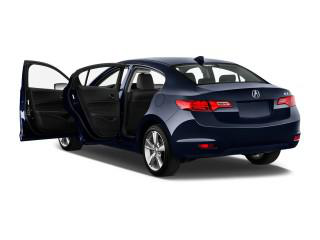

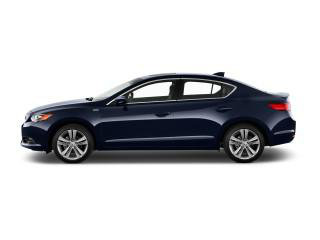

In [ ]:
cars_images_path = list(glob(str(DATA_PATH + '*.jpg')))
for image_path in cars_images_path[:2]:
    display.display(Image.open(str(image_path)))

In [ ]:
# Our goal to get images filenames
images_name = [i.split(DATA_PATH) for i in cars_images_path]
images_name = [x[:][1] for x in images_name]
cars_model = [i.split('_')[0] for i in images_name]

In [ ]:
# Extract cars models
def unique(list1): 
    list_set = set(list1) 
    unique_list = (list(list_set)) 
    return unique_list

In [ ]:
unique_cars = unique(cars_model)
len(unique_cars)

20

In [ ]:
unique_cars

['Chrysler',
 'Audi',
 'Aston Martin',
 'Tesla',
 'Volvo',
 'Rolls-Royce',
 'Bentley',
 'Chevrolet',
 'Buick',
 'Alfa Romeo',
 'Nissan',
 'Ram',
 'Cadillac',
 'Porsche',
 'Toyota',
 'Volkswagen',
 'smart',
 'Acura',
 'Subaru',
 'BMW']

In [ ]:
cars_array = np.reshape(cars_model,(-1, 1))
encoder = OrdinalEncoder()
encoder.fit(cars_array)
label_encoded = encoder.transform(cars_array)

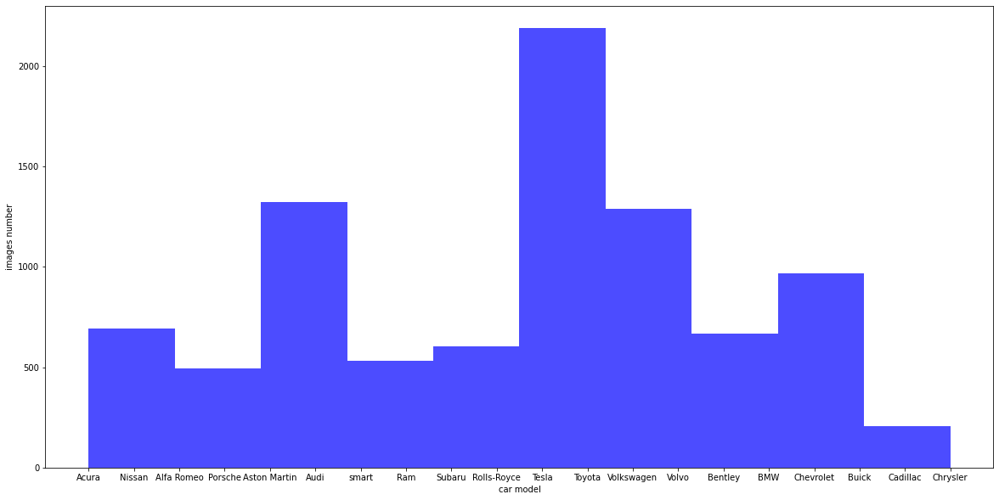

In [ ]:
plt.figure(figsize=(20,10))
plt.hist(cars_model, color = "blue", lw=0, alpha=0.7)
plt.ylabel('images number')
plt.xlabel('car model')
plt.show()

The dataset contains 8960 images:
* Three-channel each one.
* 20 labels - Diverse styles
* The minimum shape is (320, 124)
* The maximum shape is (320, 360)

### Build our Data pipeline

For the Data pipeline, we will be using Data API provide it by TensorFlow. What we have to do is create a dataset object, tell it where to get the data, then transform it in any way we want, and TensorFlow takes care of all the implementation details, such as multithreading, queuing, batching, prefetching, and so on.\
(1) Create dataset entirely in RAM using tf.data.Dataset.from_tensor_slices() \
(2) Call shuffle to ensure that the training set are independent and identically distributed. \
NB:  the buffer size must be specified, and it is important to make it large enough or else shuffling will not be very efficient.\
(3) Do the necessary transformation by calling the map() method. \
(4) Call the batch() method. It will group the items of the previous dataset in batches of n items. \
(5) Using prefetch will let the dataset work on parallel with training algorithm to get the next batch ready.
![alt text](https://drive.google.com/uc?export=view&id=1xe7O6sTg1HxbM_Fc8p57gGXB9keeaDjC)

We must scale the pixel values from the range of unsigned integers in [0,255] to the normalized range of [-1,1] or [0,1]. But you should know that if you're using [-1,1] you need to choose tanh as an activation function and if you are normalizing to [0,1] you use sigmoid activation function.

### Data Loader using TF API

In [ ]:
@tf.function
def preprocessing_data(path, labels):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [IMAGE_SHAPE[0],IMAGE_SHAPE[1]])
    image = image / 255.0
    return image, labels

In [ ]:
def dataloader(paths, labels):
    dataset = tf.data.Dataset.from_tensor_slices((paths, labels))
    dataset = dataset.shuffle(10* BATCH_SIZE)
    dataset = dataset.map(preprocessing_data)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(1)
    return dataset

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


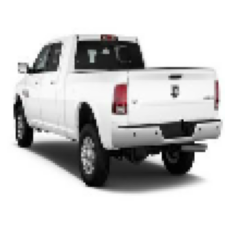

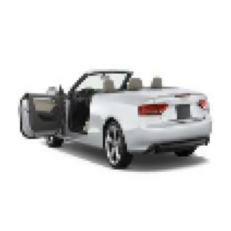

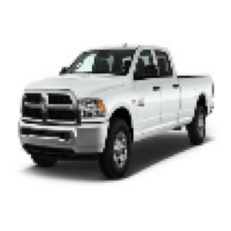

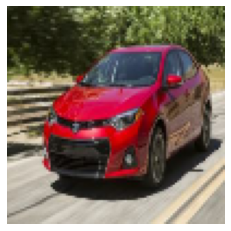

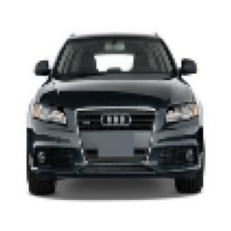

...

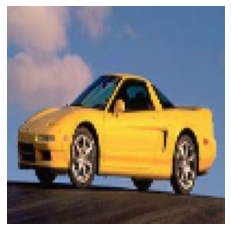

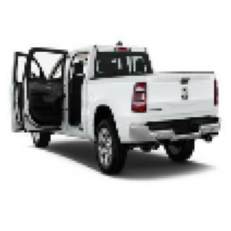

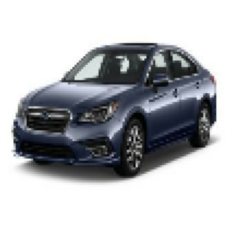

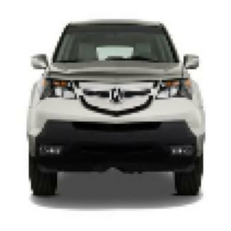

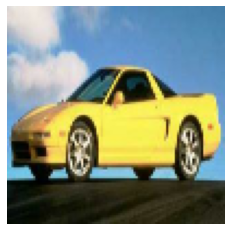

In [ ]:
dataset = dataloader(cars_images_path, label_encoded)
for batch, labels in dataset.take(1):
    for img, label in zip(batch, labels):
        img_np = img.numpy()
        plt.figure()
        plt.axis('off')
        plt.imshow((img_np-img_np.min())/(img_np.max()-img_np.min()))

# Modeling

![alt text](https://drive.google.com/uc?export=view&id=1yTm1R20_2E9DgzwbBiY3oSp9-w9zdTg4)

### Generator


![Generator.png](https://drive.google.com/uc?export=view&id=1T7akJFR7tYkV2_MHQcZvv71GfGVYXLQh)


During the latest practicals, we were using [Keras Sequential Model](https://keras.io/api/models/sequential/) API to define GANs architecture. The Sequential model API is a way of creating deep learning models where an instance of the Sequential class is created and model layers are created and added to it.

The Sequential model API is great for developing deep learning models in most situations, but it also has some limitations.

For example, it is not straightforward to define models that may have multiple different input sources, produce multiple output destinations or models that re-use layers.

In the latest practicals we were providing for the generator the noise vector and for the discriminator Real/Fake images. In this practical we will have multiple input and output. For the generator will have noise vector + class label as condition and for discriminator will have Real/Fake image + class label. This is why we will be using Keras Functional Models to re-implement the discriminator, generator.

The Keras **[Functional API](https://keras.io/getting-started/functional-api-guide/)** provides a more flexible way for defining models.

It specifically allows you to define multiple input or output models as well as models that share layers. More than that, it allows you to define ad hoc acyclic network graphs.

Models are defined by creating instances of layers and connecting them directly to each other in pairs, then defining a Model that specifies the layers to act as the input and output to the model.

Let's study the steps:
- The class label is passed through an Embedding layer with the size of 50. `50` This means that each of the 20 classes for the cars dataset will map to a different 50-element vector representation that will be learned by the generator model.
- The output of the embedding is then passed to a fully connected layer with a linear activation.
- The activations are reshaped into single 25×25 activation map and concatenated with the input image. The new 25×25 feature map is added as one more channel to the existing 128, resulting in 129 feature maps that are then upsampled as in the prior model.


In [ ]:
def make_generator_model(latent_dim, n_classes=20):
    # label input
    # embedding for categorical input
    # linear multiplication
    # reshape to additional channel

    label = Input(shape=(1,))
    label_embedding = Embedding(n_classes, 50)(label)
    label_embedding = Dense(25 * 25)(label_embedding)
    label_embedding = Reshape((25, 25, 1))(label_embedding)

    input_noise = Input(shape=(latent_dim,))
    layer = Dense(128 * 25 * 25)(input_noise)
    layer = ReLU()(layer)
    layer = Reshape((25, 25, 128))(layer)
    merge = Concatenate()([layer, label_embedding])


    layer = Conv2DTranspose(128, (5,5), strides=(1,1), padding='same', use_bias=False)(merge)
    layer = ReLU()(layer)

    layer = Conv2DTranspose(64, (5,5), strides=(2,2), padding='same', use_bias=False)(layer)
    layer = ReLU()(layer)

    output_layer = Conv2DTranspose(3, (5,5), strides=(2,2), activation='sigmoid', padding='same', use_bias=False)(layer)

    model = Model([input_noise, label], output_layer)
    model.summary()
    return model

In [ ]:
label_encoded[5]

array([0.])

Model: "functional_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 100)]        0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 1)]          0                                            
__________________________________________________________________________________________________
dense_3 (Dense)                 (None, 80000)        8080000     input_4[0][0]                    
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 1, 50)        1000        input_3[0][0]                    
_______________________________________________________________________________________

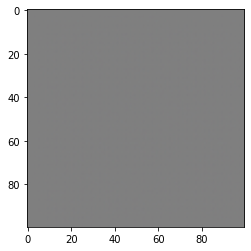

In [ ]:
generator = make_generator_model(latent_dim=100)
noise = tf.random.normal([1, LATENT_DEPTH])
generated_image = generator([noise, label_encoded[5]], training=True)

plt.imshow(generated_image[0, :, :, :], cmap='gray')

### Discriminator


![Discriminator.png](https://drive.google.com/uc?export=view&id=1DOtR-Sw_auawcpV_8ilQ5bAJZXhtyuSH)


In [ ]:
def define_discriminator(in_shape=(100,100,3), n_classes=20):
    # label input
    in_label = Input(shape=(1,))
    # embedding for categorical input
    label_embedding = Embedding(n_classes, 50)(in_label)
    # scale up to image dimensions with linear activation
    n_nodes = in_shape[0] * in_shape[1]
    label_embedding = Dense(n_nodes)(label_embedding)
    # reshape to additional channel
    label_embedding = Reshape((in_shape[0], in_shape[1], 1))(label_embedding)
    # image input
    in_image = Input(shape=in_shape)
    # concat label as a channel
    merge = Concatenate()([in_image, label_embedding])
    # downsample
    layer = Conv2D(64, (5,5), strides=(2,2), padding='same')(merge)
    layer = LeakyReLU(alpha=0.2)(layer)
    # downsample
    layer = Conv2D(128, (5,5), strides=(2,2), padding='same')(layer)
    layer = LeakyReLU(alpha=0.2)(layer)
    # flatten feature maps
    layer = Flatten()(layer)
    # dropout
    layer = Dropout(0.4)(layer)
    # output
    output_layer = Dense(1)(layer)
    # define model
    model = Model([in_image, in_label], output_layer)
    model.summary()
    return model

In [ ]:
discriminator = define_discriminator()
decision = discriminator([generated_image, label_encoded[5]])
print (decision)

Model: "functional_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 1)]          0                                            
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, 1, 50)        1000        input_5[0][0]                    
__________________________________________________________________________________________________
dense_4 (Dense)                 (None, 1, 10000)     510000      embedding_2[0][0]                
__________________________________________________________________________________________________
input_6 (InputLayer)            [(None, 100, 100, 3) 0                                            
_______________________________________________________________________________________

2×2 stride acts to down-sample the input image, first from 100×100 to 50×50, then to 25×25 before the model makes an output prediction.

## Training Process

### Loss and Optimization

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(lr=LR)
discriminator_optimizer = tf.keras.optimizers.Adam(lr=LR)

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [ ]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

### Experiment utils (RUN ME!)

In [ ]:
def summary(name_data_dict,
            step=None,
            types=['mean', 'std', 'max', 'min', 'sparsity', 'histogram'],
            historgram_buckets=None,
            name='summary'):
    """Summary.
    Examples
    --------
    >>> summary({'a': data_a, 'b': data_b})
    """
    def _summary(name, data):
        if data.shape == ():
            tf.summary.scalar(name, data, step=step)
        else:
            if 'mean' in types:
                tf.summary.scalar(name + '-mean', tf.math.reduce_mean(data), step=step)
            if 'std' in types:
                tf.summary.scalar(name + '-std', tf.math.reduce_std(data), step=step)
            if 'max' in types:
                tf.summary.scalar(name + '-max', tf.math.reduce_max(data), step=step)
            if 'min' in types:
                tf.summary.scalar(name + '-min', tf.math.reduce_min(data), step=step)
            if 'sparsity' in types:
                tf.summary.scalar(name + '-sparsity', tf.math.zero_fraction(data), step=step)
            if 'histogram' in types:
                tf.summary.histogram(name, data, step=step, buckets=historgram_buckets)

    with tf.name_scope(name):
        for name, data in name_data_dict.items():
            _summary(name, data)

In [ ]:
train_summary_writer = tf.summary.create_file_writer(os.path.join(MODEL_SAVE_PATH, 'summaries', 'train'))
checkpoint_prefix = os.path.join(CHECKPOINT_DIR, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [ ]:
def generate_and_save_images(model, label, epoch):
    
    plt.figure(figsize=(15,10))

    for i in range(4):
        noise = tf.random.normal([1,100])
        images = model([noise, label[0]], training=False)
        print(label[0])
        image = images[0, :, :, :]
        image = np.reshape(image, [100, 100, 3])

        plt.subplot(1, 4, i+1)
        plt.imshow(image, cmap='gray')
        plt.axis('off')
        plt.title("Randomly Generated Images")

    plt.tight_layout()  
    plt.savefig(os.path.join(MODEL_SAVE_PATH,'image_at_epoch_{:02d}.png'.format(epoch)))
    plt.show()

### Model Traning

In [ ]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_step(images, label):
    noise = tf.random.normal([BATCH_SIZE, LATENT_DEPTH])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator([noise, label], training=True)

        real_output = discriminator([images, label], training=True)
        fake_output = discriminator([generated_images, label], training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    return {'Generator loss': gen_loss,
            'Discriminator loss': disc_loss}

In [ ]:
def train(dataset, epochs):
    with train_summary_writer.as_default():
        with tf.summary.record_if(True):
            for epoch in range(epochs):
                start = time.time()

                for image_batch, labels in dataset:
                    loss_dict = train_step(image_batch, labels)
                summary(loss_dict, step=generator_optimizer.iterations, name='losses')
                # Save the model every 15 epochs
                if (epoch + 1) % 15 == 0:
                    checkpoint.save(file_prefix = checkpoint_prefix)
                    display.clear_output(wait=True)
                    generate_and_save_images(generator, labels,
                                             epoch + 1)
                print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))


    # Generate after the final epoch
    display.clear_output(wait=True)
#     generate_and_save_images(generator, epochs)

In [ ]:
%tensorboard --logdir='/content/drive/My Drive/lecture hands on lab/cGAN/results/train_cGAN/'

<IPython.core.display.Javascript object>

tf.Tensor([8.], shape=(1,), dtype=float64)
tf.Tensor([8.], shape=(1,), dtype=float64)
tf.Tensor([8.], shape=(1,), dtype=float64)
tf.Tensor([8.], shape=(1,), dtype=float64)


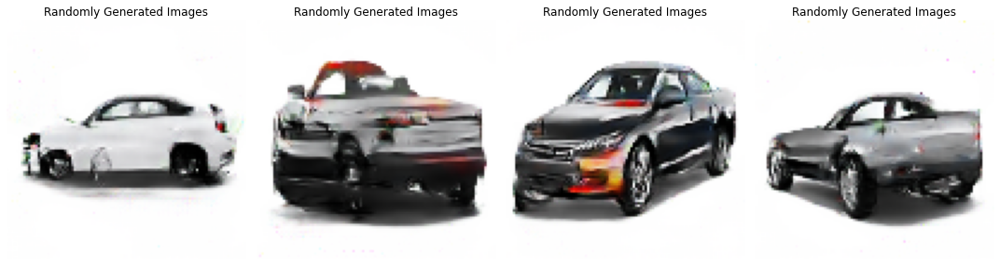

Time for epoch 300 is 8.890963792800903 sec


In [ ]:
train(dataset, EPOCHS)

 ### Generate Gif with the whole generated images during training

In [ ]:
anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob(os.path.join(MODEL_SAVE_PATH, 'image*.png'))
    filenames = sorted(filenames)
    last = -1
    for i,filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

import IPython
if IPython.version_info > (6,2,0,''):
    display.Image(filename=anim_file)

# Congratulations!
You have built your first cGAN

### Suggestion tasks for practice

* Play arround with the model architecture
* Play arround with optimizer
* Tuning the hyperparameters
  - Learning rate
  - Batch size
  - Number of epochs
  - Generator optimizer
  - Discriminator optimizer
  - Number of layers
  - Number of units in a dense layer
  - Activation function
* Observe the discriminator and generator loss failure and image generation failure using tensorboard

### Practical Applications

* Generate your own drawing board
* Generate your car, clothes or any object style
* Augmenting dataset
* Human face generation
* Feature extraction
